<a href="https://colab.research.google.com/github/Yassaadi/bank_scoring/blob/main/Yassine_Assaadi_P7_Scoring_app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook summary:


*   Data exploration
*   Features engineering
*   Data preparation
*   Metrics definition
*   Model tetsing and tracking
*   Model registry
*   Streamlit dashboard creation
*   Flask app creation
*   Data drift analysis
*   Cloud deployment











  
  



# Import libraries

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp


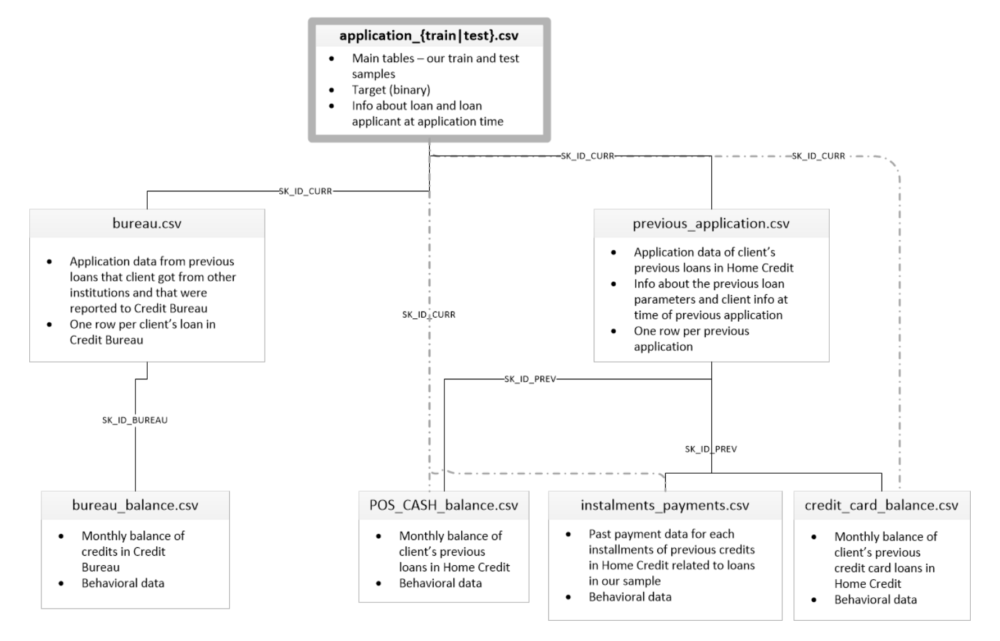

In [ ]:
#GOOGLE COLAB
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab Notebooks/P7-ScoringApp
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/P7_data_structure.png',width=800, height=500)

In [ ]:
!pip install lightgbm
!pip install catboost
!pip install mlflow
!pip install pyngrok --quiet
!pip install streamlit
!pip install flask_ngrok
!pip install streamlit_echarts

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#BASIC LIBs
import pandas as pd
import numpy as np
import seaborn as sns
import time
import matplotlib.pyplot as plt
import sklearn
import pickle
import mlflow.pyfunc
from mlflow.models.signature import infer_signature
import mlflow.sklearn
import mlflow
from pyngrok import ngrok
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler


#STAT TOOLS
from math import sqrt
from scipy import stats #BoxCox
import random
from numpy.lib.function_base import percentile
#from pandas.core.algorithms import quantile

#GRAPHS
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

#TRANSFORMATION
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer
from sklearn.compose import ColumnTransformer

from sklearn.decomposition import PCA

#METRICS
from sklearn import metrics
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import ConfusionMatrixDisplay
#from metrics import plot_roc_curve
#from metrics import plot_confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

#DATA SPLITING
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

#IMPUTERS
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

#REGRESSION MODELS
from sklearn.dummy import DummyClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier

#GRIDSEARCH
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#PIPELINES
from sklearn.pipeline import Pipeline

#Columns & rows size
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)


#graphs default configuration
plt.rcParams['figure.figsize']=(10,6)
plt.style.use('fivethirtyeight')
%config InlineBackend.figure_formats = ['svg']

# Usefull functions

## Data cleaning

In [ ]:
def DropLimit(df, limit, column):
  dfi = df.copy()
  if column:
    for column in dfi:
        if dfi[column].notnull().sum() < limit:
            dfi=dfi.drop(column,axis=1)
  if column == False:
    dfi = dfi[dfi.notnull().mean(axis = 1) > limit]

  print(f'Dataframe old shape {df.shape}\nDataframe new shape {dfi.shape}')
  return dfi

## Transformation function

In [ ]:
def transform(df,boxcox,normalize):

  #Adapt data type to function: Convert pd.series to pd.DataFrame type
  if isinstance(df, pd.DataFrame):
    dfT= df.copy()
  elif isinstance(df, pd.Series):
    dfT = df.to_frame()
  #List of variables to transform/ Can be added as a parameter of the function
  tran_list = dfT.columns

  #Transform to positive data
   #Convert negative values
  for column in tran_list :
    dfT[column] = dfT[column].apply(lambda x: x*-1  if x<=0 else x)

   #Translation to (>0)
  for column in tran_list:
      if dfT[column].min() == 0.0:
          dfT[column] = dfT[column] + dfT[dfT[column]>0][column].min()

  #Boxcox/Logarithm transformation
  if boxcox:
    lmbdas= []
    for column in tran_list:
      BoxCox_data, lmbda = stats.boxcox(dfT[column])
      dfT[column] = BoxCox_data
      lmbdas.append([column,lmbda])
    print(lmbdas)

  #Standard normalization
  if normalize:
    Normalization = ColumnTransformer([("Normalization", StandardScaler(), tran_list)])
    Normalized = pd.DataFrame(Normalization.fit_transform(dfT), index= dfT.index,   columns= tran_list)
    for column in tran_list:
      dfT[column] = Normalized[column]

  return dfT

## Outliers elimination

In [ ]:
upper_lim=0.99
lower_lim=0.01

def Outliers_Cleaner(df, lower_lim, upper_lim, variables):
  #Adapt data type to function: Convert pd.series to pd.DataFrame type
  if isinstance(df,pd.Series) :
    dfT = df.to_frame()
  else :
    dfT = df.copy()

  #Compute quantiles and eleminate outliers
  for col in variables:
    print(f'{col}\nShape before outliers elimination = {dfT.shape}')
    Q1 = dfT[col].quantile(lower_lim)
    Q3 = dfT[col].quantile(upper_lim)
    IQR = Q3 - Q1
    dfT = dfT[ (dfT[col] <= (Q3 + 1.5*IQR)) & (dfT[col] >= (Q1 - 1.5*IQR)) ]
    print(f'Shape after outliers elimination = {dfT.shape}')
  return dfT

## Pearson correlation map

In [ ]:
def Pearson_corr(df,x,y,annot):
  plt.figure(figsize=(x, y))
  mask = np.triu(np.ones_like(df.corr(), dtype=bool))
  ax = sns.heatmap(
      df.corr(),
      vmin=-1, vmax=1, center=0,
      cmap='RdYlGn',
      mask=mask,
      square=True,
      annot = annot,
      annot_kws={"size": 5})

  ax.set_title('Variables Correlation', fontdict={'fontsize':12}, pad=8);

  ax.set_xticklabels(
      ax.get_xticklabels(),
      rotation=45,
      horizontalalignment='right')

## ngrok tunnel

In [ ]:
def ngrok_tunnel(port):
  ngrok.kill()
  NGROK_AUTH_TOKEN ="2NCNhQH4tIpApomK9f9PrqShS1t_oMF5TYNPj1ZbZHBmZGiT"
  ngrok.set_auth_token(NGROK_AUTH_TOKEN)
  ngrok_tunnel = ngrok.connect(addr=port, proto = "http", bind_tls = True)
  print("Tracking UI:", ngrok_tunnel.public_url)

## Client DATA


In [ ]:
def client_data(client_id, features):
  return df.loc[df["SK_ID_CURR"]==client_id, features]

## Data balance

In [ ]:
def target_balance(y_train, sampling_method):
  # Specify colors for each bar
  colors = ['red' if i == 1 else 'blue' for i in range(2)]
  # Plot the bar chart with the specified colors
  count = y_train.value_counts()
  ax = count.plot(kind='bar', title=f'{sampling_method}:\n Target category count', color=colors)
  for i, v in enumerate(count):
    ax.text(i, v + 10, str(v), ha='center')
  plt.subplots_adjust(top=0.8)
  ax.set_title(ax.get_title(), fontsize=14)
  plt.show()

## Scoring and metrics

In [ ]:
from sklearn.metrics import fbeta_score, make_scorer, roc_auc_score, accuracy_score, precision_score, recall_score, log_loss

scoring = {
    'auc': make_scorer(roc_auc_score),
    'fcb': make_scorer(fbeta_score, beta=10),
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'enropy': make_scorer(log_loss)
}

In [ ]:
def get_metrics(model, y_test, X_test):
  y_pred, y_pred_prob = prediction(model, X_test)

  acc = accuracy_score(y_test, y_pred)
  auc = roc_auc_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  fcb = fbeta_score(y_test, y_pred, beta=10)
  recall = recall_score(y_test, y_pred)
  entropy = log_loss(y_test, y_pred_prob)

  #Print model metrics
  print(f'ROC_AUC best score: {round(auc, 2)}')
  print(f'Fcb score: {round(fcb, 2)}')
  print(f'Accuracy score: {round(acc, 2)}')
  print(f'Recall score: {round(recall, 2)}')
  print(f'Precision score: {round(precision, 2)}')
  print(f'Entropy score: {round(entropy, 2)}')
  return {'ROC_AUC': round(auc, 2) ,'Fcb': round(fcb, 2) ,'accuracy': round(acc, 2),
          'precision': round(precision, 2), 'recall': round(recall, 2), 'entropy': round(entropy, 2)}

In [ ]:
def roc_auc_plot(model, X_test, y_test):
  y_pred,_ = prediction(model, X_test)
  RocCurveDisplay.from_predictions(y_test, y_pred, name="micro-average OvR", color="darkorange",)
  plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
  plt.axis("square",)
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.title(f"{model}:\n ROC_AUC curve", fontsize=8)
  plt.legend()
  plt.savefig('roc_auc_curve.png')
  plt.show()

In [ ]:
def confusion_matrix(model, X_test, y_test):
  y_pred,_ = prediction(model, X_test)
  ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
  plt.savefig('confusion_matrix.png')
  plt.show()

## MLFlow

### Tracking experiments

In [ ]:
def experiment(exp_name, run_name, run_metrics, model, tag, confusion_matrix_path = None,
                      roc_auc_plot_path = None, run_params=None):

    mlflow.set_tracking_uri("http://localhost:5000") #to set URI => URL
    mlflow.set_experiment(exp_name)

    with mlflow.start_run():

        # Load model parameters
        if not run_params == None:
            for param in run_params:
                mlflow.log_param(param, run_params[param])
        # Load model metrics
        for metric in run_metrics:
            mlflow.log_metric(metric, run_metrics[metric])
        # load model
        mlflow.sklearn.log_model(model, "model")
        # To register at the same time:
        #mlflow.sklearn.log_model(model, "model",registered_model_name="XXX_classifier")
        # Load confusion matrix
        if not confusion_matrix_path == None:
            mlflow.log_artifact(confusion_matrix_path, 'confusion_materix')
        # Load AUC curve
        if not roc_auc_plot_path == None:
            mlflow.log_artifact(roc_auc_plot_path, "roc_auc_plot")
        mlflow.set_tag("Model", tag)

    print('Run - %s is logged to Experiment - %s' %(run_name, exp_name))

### Model registry

In [ ]:
#Method1: Register model usinbg logged model path
def model_registry1(logged_model, registered_model_name):
  import mlflow
  with mlflow.start_run(run_name=run_name) as run:
      result = mlflow.register_model(
          logged_model,
          registered_model_name
      )

In [ ]:
#Method2
#Create an empty registered model with no version associated or new version of a registered model

def model_registry2(registered_model_name, model_source , run_id ):
  import mlflow
  if model_source is None and model_run is None:
    client = mlflow.tracking.MlflowClient()
    client.create_registered_model(registered_model_name)
  else :
    #the method below creates a new version of the model.
    client = mlflow.tracking.MlflowClient()
    result = client.create_model_version(
        name= registered_model_name,
        source= model_source,
        run_id = run_id
    )

## Modeling

In [ ]:
def model_training(model, model_params, X_train, y_train):
  model_RDCV = RandomizedSearchCV(model, param_distributions = model_params, cv=5 , scoring=scoring, refit='auc')
  model_RDCV.fit(X_train, y_train)
  print(f'\n{model} best parameters {model_RDCV.best_params_}')
  return model_RDCV.best_estimator_, model_RDCV.best_params_

In [ ]:
def prediction(model, X_test):
  y_pred_prob = model.predict_proba(X_test)
  y_pred = model.predict(X_test)
  return y_pred, y_pred_prob

# Loading data

In [ ]:
path= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/HomeCredit_columns_description.csv"
path1= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/application_train.csv"
path2= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/application_test.csv"
path3= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/bureau.csv"
path4= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/bureau_balance.csv"
path5= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/credit_card_balance.csv"
path6= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/installments_payments.csv"
path7= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/previous_application.csv"
path8= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/sample_submission.csv"
path9= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/POS_CASH_balance.csv"

In [ ]:
def readCSV(path):
  return pd.read_csv(path, encoding="ISO-8859-1")#, encoding="UTF-8")

PATH = [path, path1, path2, path3, path4, path5, path6, path7, path8, path9]
DF=[]
for i in PATH:
  DF.append(readCSV(i))

In [ ]:
DF[1]['TARGET'].unique()

array([1, 0])

In [ ]:
features = ['EXT_SOURCE_2', 'PAYMENT_RATE', 'CODE_GENDER', 'BURO_DAYS_CREDIT_MEAN', 'DAYS_BIRTH',
    'DAYS_ID_PUBLISH', 'BURO_DAYS_CREDIT_UPDATE_MEAN']

In [ ]:
DF[0][DF[0]['Row']=='TARGET']

,Unnamed: 0,Table,Row,Description,Special
1,2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN


# Features engineering

In [ ]:
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

application train and test

In [ ]:
# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read train and test data
    df = pd.read_csv(path1, nrows= num_rows)
    test_df = pd.read_csv(path2, nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    #merging test/train data
    df = df.append(test_df).reset_index()

    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']

    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])

    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)

    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)

    # Some simple new features (percentages)
    ##current job long/client age
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    ##Annual income/total loan
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    ##Annual income/family members
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    ##Annuity/Annual income
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    ##Annuity/total loan
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    return df

bureau and bureau_balance

In [ ]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    #read csv files: bureau and bureau_balance
    bureau = pd.read_csv(path3, nrows = num_rows)
    bb = pd.read_csv(path4, nrows = num_rows)
    #OHE categorical features for both b and bb and get cat columns
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)

    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    #group bb by id_bureau and aggregate 'MONTHS_BALANCE' by min/max/size and reste of columns by mean
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    #merge b and bb on id_bureau, drop id_bureau col and bb and bb_agg dataframe
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    #gc.collect()

    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']

    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    ##gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    ##gc.collect()
    return bureau_agg

previous application

In [ ]:
# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv(path7, nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']

    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    ##gc.collect()
    return prev_agg

POS_CASH_balance

In [ ]:
# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv(path9, nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']

    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    ##gc.collect()
    return pos_agg

Installments payments

In [ ]:
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv(path6, nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    ##gc.collect()
    return ins_agg

credit_card_balance

In [ ]:
# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv(path5, nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    ##gc.collect()
    return cc_agg

# Main script

In [ ]:
df = application_train_test()
bureau = bureau_and_balance()
df = df.join(bureau, how='left', on='SK_ID_CURR')
del bureau
prev = previous_applications()
df = df.join(prev, how='left', on='SK_ID_CURR')
del prev
pos = pos_cash()
df = df.join(pos, how='left', on='SK_ID_CURR')
del pos
ins = installments_payments()
df = df.join(ins, how='left', on='SK_ID_CURR')
del ins
cc = credit_card_balance()
df = df.join(cc, how='left', on='SK_ID_CURR')
del cc
drift_data = df[df['TARGET'].isnull()]
df[df['TARGET'].isnull()]['TARGET'] =2

Train samples: 307511, test samples: 48744


<ipython-input-19-544a74c37397>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(test_df).reset_index()
<ipython-input-25-6e6cf1918338>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[df['TARGET'].isnull()]['TARGET'] =2


In [ ]:
drift_data = df[df['TARGET'].isnull()]
ref_data = df[df['TARGET'].notnull()]
ref_data.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZ

In [ ]:
ref_data.to_csv("/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/ref_data.csv", encoding='UTF8')
drift_data.to_csv("/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/drift_data.csv", encoding='UTF8')

In [ ]:
row_limit = 300000
dft= DropLimit(df ,row_limit , True)
dft=dft.dropna(axis=0)
dft.shape
#Save preprocessed data to csv
Path= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/preprocessed.csv"
dft.to_csv(Path, encoding='UTF8')

In [ ]:
path= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/preprocessed.csv"
#Loading data from csv file #
txt = pd.read_csv(path, engine= 'python', sep=',', chunksize=100, usecols=lambda col: col not in ['Unnamed: 0', 'index'])
dft = pd.concat(txt, ignore_index=True)

# Model testing

In [ ]:
num_rows = 10000
path= "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/preprocessed.csv"
#Loading data from csv file #
txt = pd.read_csv(path, nrows= num_rows,  engine= 'python', sep=',', chunksize=100, usecols=lambda col: col not in ['Unnamed: 0', 'index'])
df = pd.concat(txt, ignore_index=True)
#Data NAN cleaning by droping
df.shape

(10000, 503)

## Data samples preparation

In [ ]:
#DATA SPLIT
train_df = df[df['TARGET']!=2]
test_df = df[df['TARGET']==2] #no TARGET column in application_test data

#Define model features and target feature
X_feat= [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV']]
X=train_df[X_feat]
y=train_df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
print(f'X_train shape{X_train.shape}, y_train shape{y_train.shape}')
print(f'X_test shape{X_test.shape}, y_test shape{y_test.shape}')

X_train shape(8000, 501), y_train shape(8000,)
X_test shape(2000, 501), y_test shape(2000,)


### Target balance function

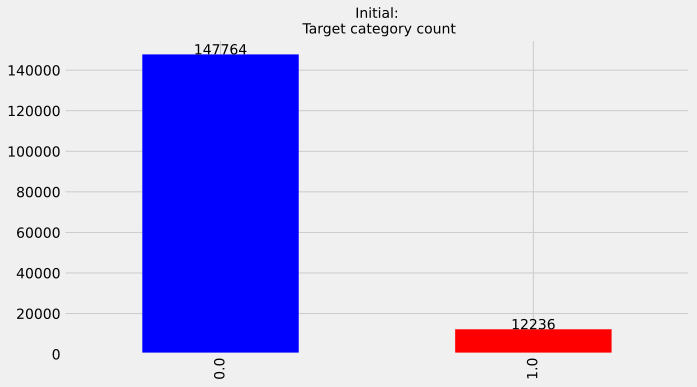

In [ ]:
target_balance(y_train, 'Initial')

### SMOTE and Undersampling

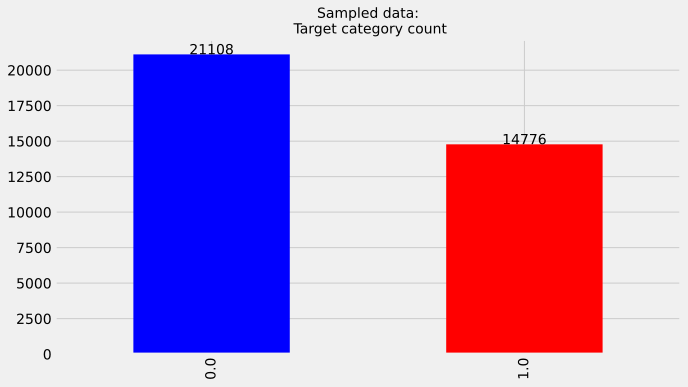

In [ ]:
from imblearn.pipeline import Pipeline

smote_strategy = 0.1
rus_strategy= 0.7
# Create SMOTE object
smote = SMOTE(sampling_strategy=smote_strategy, k_neighbors=5)
rus = RandomUnderSampler(sampling_strategy=rus_strategy)
steps= [('sm',smote),('us',rus)]
sampipline = Pipeline(steps=steps)

# Apply SMOTE to the training data
Xsd_train, ysd_train = sampipline.fit_resample(X_train, y_train)

#Plot data sampling
target_balance(ysd_train, 'Sampled data')

## Data transformation

In [ ]:
scaler = preprocessing.StandardScaler()
Xs_train = scaler.fit_transform(Xsd_train)
Xs_test = scaler.transform(X_test)
ys_train = ysd_train
ys_test = y_test

## Modeling and tracking

 Set backend SQlite dabase

start the MLflow server. The server will use an SQLite database file named "mlflow.db" located in the current directory (Drive) as the backend store for experiment metadata, and it will store artifacts in a directory named "artifacts" located in the current directory. The server will listen on IP address 0.0.0.0 and port 5000 for incoming requests from MLflow clients, such as Python scripts or the MLflow UI.

In [ ]:
#Command:
# Start Mlflow server and use database like sqlite as backend storage for model
!mlflow server \--backend-store-uri sqlite:///mlflow.db \
    --default-artifact-root ./artifacts \
    --host 0.0.0.0 \
    --port 5000 \
    &> /dev/null &
#Or Start the Mlflow server => File system is used as a backend => No MODEL REGISTRY !!!
# !mlflow ui

In [ ]:
ngrok_tunnel("5000")

INFO:pyngrok.process:Killing ngrok process: 179860
2023-03-24 10:40:42.046 Killing ngrok process: 179860
INFO:pyngrok.process:Updating authtoken for default "config_path" of "ngrok_path": /usr/local/lib/python3.9/dist-packages/pyngrok/bin/ngrok
2023-03-24 10:40:42.068 Updating authtoken for default "config_path" of "ngrok_path": /usr/local/lib/python3.9/dist-packages/pyngrok/bin/ngrok
INFO:pyngrok.ngrok:Opening tunnel named: http-5000-b2b8514a-b6be-431b-aa31-a809ca84e7a4
2023-03-24 10:40:42.271 Opening tunnel named: http-5000-b2b8514a-b6be-431b-aa31-a809ca84e7a4
INFO:pyngrok.process.ngrok:t=2023-03-24T10:40:42+0000 lvl=info msg="no configuration paths supplied"
2023-03-24 10:40:42.453 t=2023-03-24T10:40:42+0000 lvl=info msg="no configuration paths supplied"
INFO:pyngrok.process.ngrok:t=2023-03-24T10:40:42+0000 lvl=info msg="using configuration at default config path" path=/root/.ngrok2/ngrok.yml
2023-03-24 10:40:42.461 t=2023-03-24T10:40:42+0000 lvl=info msg="using configuration at def

Tracking UI: https://e71e-34-86-41-133.ngrok.io


2023-03-24 10:40:42.688 t=2023-03-24T10:40:42+0000 lvl=info msg=start pg=/api/tunnels id=4ffc3657fc5a7c90
INFO:pyngrok.process.ngrok:t=2023-03-24T10:40:42+0000 lvl=info msg="started tunnel" obj=tunnels name=http-5000-b2b8514a-b6be-431b-aa31-a809ca84e7a4 addr=http://localhost:5000 url=https://e71e-34-86-41-133.ngrok.io
2023-03-24 10:40:42.717 t=2023-03-24T10:40:42+0000 lvl=info msg="started tunnel" obj=tunnels name=http-5000-b2b8514a-b6be-431b-aa31-a809ca84e7a4 addr=http://localhost:5000 url=https://e71e-34-86-41-133.ngrok.io
INFO:pyngrok.process.ngrok:t=2023-03-24T10:40:42+0000 lvl=info msg=end pg=/api/tunnels id=4ffc3657fc5a7c90 status=201 dur=33.184196ms
2023-03-24 10:40:42.731 t=2023-03-24T10:40:42+0000 lvl=info msg=end pg=/api/tunnels id=4ffc3657fc5a7c90 status=201 dur=33.184196ms


### 1st experiment: Dummy classifier

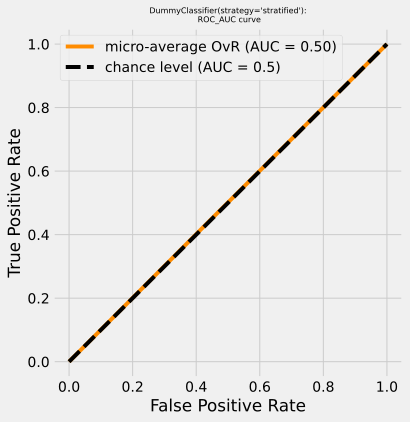

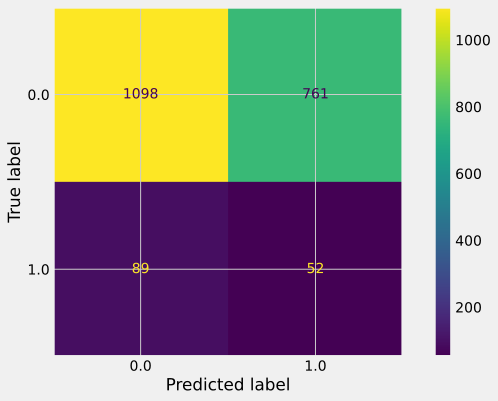

ROC_AUC best score: 0.47
Fcb score: 0.34
Accuracy score: 0.56
Recall score: 0.35
Precision score: 0.06
Entropy score: 15.41


In [ ]:
dummy = DummyClassifier(strategy = "stratified")
# Fit the classifier to the data
dummy.fit(Xs_train, ys_train)
# Adjust probability of class 1 to 20%
dummy.predict_proba(X)[:, 1] = 0.2
# Display ROC_AUC curve
roc_auc_plot(dummy, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(dummy, Xs_test, ys_test)
# Dummy classifier metrics
_,_,_,_,_,_= get_metrics(dummy, ys_test, Xs_test)

In [ ]:
exp_name = "Dummy_classifier"
model = dummy
tag= "Dummy"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(dummy, ys_test, Xs_test)
run_params = None

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.5
Fcb score: 0.4
Accuracy score: 0.57
Recall score: 0.42
Precision score: 0.07
Entropy score: 15.21
Run - SMOTE10_RUS70 is logged to Experiment - Dummy_classifier


### 2nd experiment: XGB


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...) best parameters {'subsample': 1.0, 'n_estimators': 100, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.3, 'gamma': 1, 'colsample_bytree': 0.6}


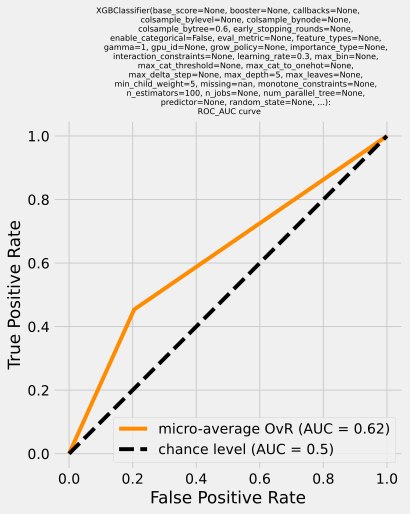

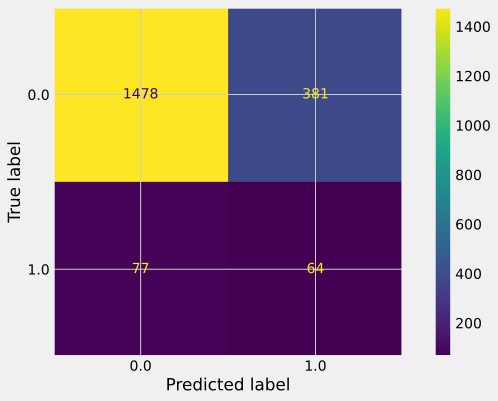

ROC_AUC best score: 0.62
Fcb score: 0.44
Accuracy score: 0.77
Recall score: 0.45
Precision score: 0.14
Entropy score: 0.49


In [ ]:
# Define XGBClassifier algorithm
XGB = XGBClassifier(objective='binary:logistic')
# Define Randomizedsearch parameters
XGB_params = {
    'learning_rate': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'max_depth': [3, 5, 10, 20, 30, None],
    'n_estimators': [10, 50, 100, 200, 500],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.5, 1, 1.5, 2, 5]
            }
# Training model on prerocessed train data
XGB_RDCV, XGB_BP = model_training(XGB, XGB_params, Xs_train, ys_train)
# Display ROC_AUC curve
roc_auc_plot(XGB_RDCV, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(XGB_RDCV, Xs_test, ys_test)
#Get and show best estimator parameters and corresponding best score
_,_,_,_,_,_= get_metrics(XGB_RDCV, ys_test, Xs_test)

In [ ]:
exp_name = "XGB_classifier"
model = XGB_RDCV
tag= "XGBoost"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(XGB_RDCV, ys_test, Xs_test)
run_params = XGB_BP

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.62
Fcb score: 0.44
Accuracy score: 0.77
Recall score: 0.45
Precision score: 0.14
Entropy score: 0.49
Run - SMOTE10_RUS70 is logged to Experiment - XGB_classifier


### 3rd experiment: LGBM


LGBMClassifier() best parameters {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 2, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 30, 'learning_rate': 0.1, 'colsample_bytree': 0.8}


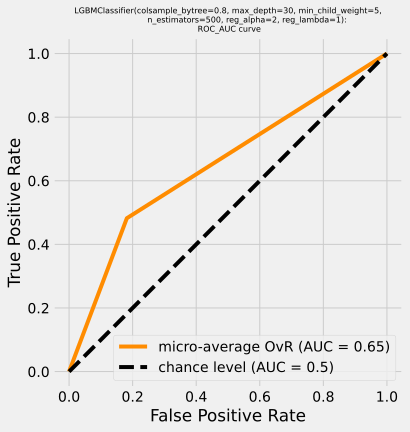

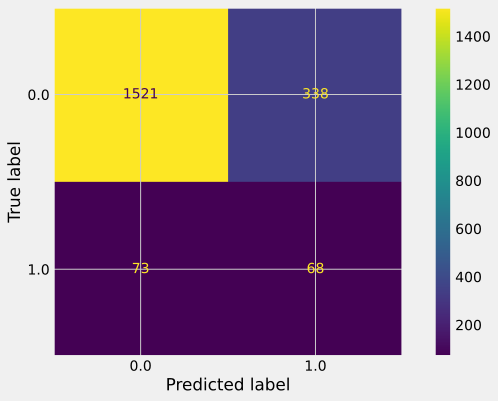

ROC_AUC best score: 0.65
Fcb score: 0.47
Accuracy score: 0.79
Recall score: 0.48
Precision score: 0.17
Entropy score: 0.44


In [ ]:
# Define LightGBM algorithm
LGBM = LGBMClassifier()

# Define Randomizedsearch parameters for LightGBM
LGBM_params = {
    'learning_rate': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'max_depth': [3, 5, 10, 20, 30, None],
    'n_estimators': [10, 50, 100, 200, 500],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 0.5, 1, 1.5, 2, 5],
    'reg_lambda': [0, 0.1, 0.5, 1, 1.5, 2, 5]
}
# Training model on prerocessed train data
LGBM_RDCV, LGBM_BP = model_training(LGBM, LGBM_params, Xs_train, ys_train)
# Display ROC_AUC curve
roc_auc_plot(LGBM_RDCV, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(LGBM_RDCV, Xs_test, ys_test)
#Get and show best estimator parameters and corresponding best score
_,_,_,_,_,_= get_metrics(LGBM_RDCV, ys_test, Xs_test)

In [ ]:
exp_name = "LGBM_classifier"
model = LGBM_RDCV
tag= "LGBM"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(LGBM_RDCV, ys_test, Xs_test)
run_params = LGBM_BP

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.65
Fcb score: 0.47
Accuracy score: 0.79
Recall score: 0.48
Precision score: 0.17
Entropy score: 0.44
Run - SMOTE10_RUS70 is logged to Experiment - LGBM_classifier


### 4th experiment: CatB

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
100:	learn: 0.1034268	total: 3.18s	remaining: 12.6s
101:	learn: 0.1019662	total: 3.21s	remaining: 12.5s
102:	learn: 0.1004432	total: 3.24s	remaining: 12.5s
103:	learn: 0.0985124	total: 3.27s	remaining: 12.5s
104:	learn: 0.0983596	total: 3.3s	remaining: 12.4s
105:	learn: 0.0978294	total: 3.34s	remaining: 12.4s
106:	learn: 0.0951050	total: 3.37s	remaining: 12.4s
107:	learn: 0.0938015	total: 3.41s	remaining: 12.4s
108:	learn: 0.0928996	total: 3.43s	remaining: 12.3s
109:	learn: 0.0908503	total: 3.46s	remaining: 12.3s
110:	learn: 0.0890145	total: 3.49s	remaining: 12.2s
111:	learn: 0.0876943	total: 3.52s	remaining: 12.2s
112:	learn: 0.0866856	total: 3.55s	remaining: 12.2s
113:	learn: 0.0848145	total: 3.58s	remaining: 12.1s
114:	learn: 0.0838013	total: 3.61s	remaining: 12.1s
115:	learn: 0.0826924	total: 3.64s	remaining: 12s
116:	learn: 0.0814167	total: 3.67s	remaining: 12s
117:	learn: 0.0797577	total: 3.69s	remainin

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.9/dist-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/usr/local/lib/python3.9/dist-packages/catboost/core.py", line 2339, in _fit
    train_p

0:	learn: 0.6618088	total: 29.8ms	remaining: 14.9s
1:	learn: 0.6420173	total: 69.9ms	remaining: 17.4s
2:	learn: 0.6224779	total: 105ms	remaining: 17.5s
3:	learn: 0.6096208	total: 145ms	remaining: 17.9s
4:	learn: 0.5938183	total: 172ms	remaining: 17s
5:	learn: 0.5770084	total: 206ms	remaining: 16.9s
6:	learn: 0.5642621	total: 243ms	remaining: 17.1s
7:	learn: 0.5528467	total: 275ms	remaining: 16.9s
8:	learn: 0.5395240	total: 307ms	remaining: 16.8s
9:	learn: 0.5309289	total: 333ms	remaining: 16.3s
10:	learn: 0.5222075	total: 365ms	remaining: 16.2s
11:	learn: 0.5102630	total: 392ms	remaining: 15.9s
12:	learn: 0.5013764	total: 423ms	remaining: 15.9s
13:	learn: 0.4920733	total: 458ms	remaining: 15.9s
14:	learn: 0.4845218	total: 502ms	remaining: 16.2s
15:	learn: 0.4789023	total: 531ms	remaining: 16s
16:	learn: 0.4705840	total: 565ms	remaining: 16s
17:	learn: 0.4658169	total: 596ms	remaining: 16s
18:	learn: 0.4602397	total: 624ms	remaining: 15.8s
19:	learn: 0.4532789	total: 659ms	remaining: 15

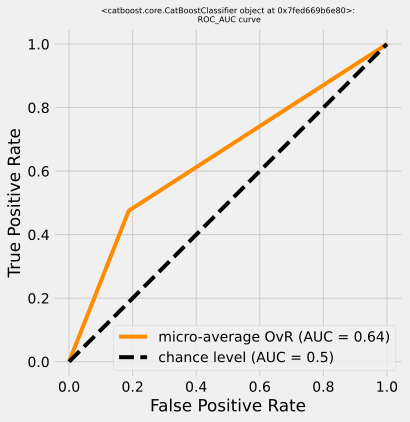

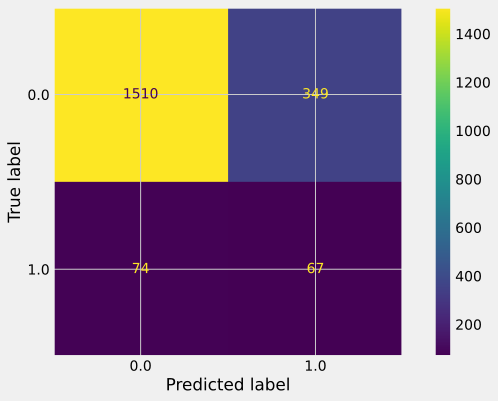

ROC_AUC best score: 0.64
Fcb score: 0.47
Accuracy score: 0.79
Recall score: 0.48
Precision score: 0.16
Entropy score: 0.54


In [ ]:
# Define CatBoost algorithm
CatB = CatBoostClassifier()

# Define Randomizedsearch parameters for CatBoost
CatB_params = {
    'learning_rate': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'max_depth': [3, 5, 10, 20, None],
    'n_estimators': [10, 50, 100, 200, 500],
    'l2_leaf_reg': [0, 0.1, 0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bylevel': [0.6, 0.8, 1.0],
}
# Training model on prerocessed train data
CatB_RDCV, CatB_BP = model_training(CatB, CatB_params, Xs_train, ys_train)
# Display ROC_AUC curve
roc_auc_plot(CatB_RDCV, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(CatB_RDCV, Xs_test, ys_test)
#Get and show best estimator parameters and corresponding best score
_,_,_,_,_,_= get_metrics(CatB_RDCV, ys_test, Xs_test)

In [ ]:
exp_name = "CatBoost_classifier"
model = CatB_RDCV
tag= "CatBoost"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(CatB_RDCV, ys_test, Xs_test)
run_params = CatB_BP

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.64
Fcb score: 0.47
Accuracy score: 0.79
Recall score: 0.48
Precision score: 0.16
Entropy score: 0.54


2023/03/23 02:01:10 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpj625msxp/model/model.pkl, flavor: sklearn), fall back to return ['scikit-learn==1.2.2', 'cloudpickle==2.2.1']. Set logging level to DEBUG to see the full traceback.


Run - SMOTE10_RUS70 is logged to Experiment - CatBoost_classifier


### 5th experiment: RF


RandomForestClassifier() best parameters {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 30, 'criterion': 'entropy', 'bootstrap': False}


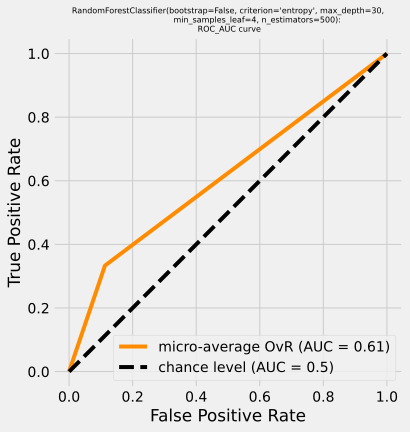

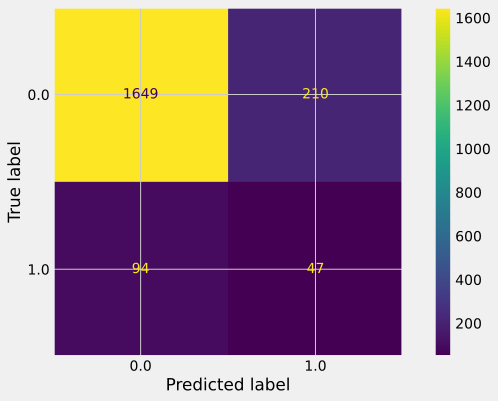

ROC_AUC best score: 0.61
Fcb score: 0.33
Accuracy score: 0.85
Recall score: 0.33
Precision score: 0.18
Entropy score: 0.47


In [ ]:
#Define RandomForestClassifier algorithm
RF = RandomForestClassifier()

# Define Randomizedsearch parameters for RandomForest
RF_params = {
    'n_estimators': [10, 50, 100, 200, 500],
    'max_depth': [3, 5, 10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy']
}
# Training model on prerocessed train data
RF_RDCV, RF_BP = model_training(RF, RF_params, Xs_train, ys_train)
# Display ROC_AUC curve
roc_auc_plot(RF_RDCV, Xs_test, y_test)
# Display confusion matrix
confusion_matrix(RF_RDCV, Xs_test, ys_test)
#Get and show best estimator parameters and corresponding best score
_,_,_,_,_,_= get_metrics(RF_RDCV, ys_test, Xs_test)

In [ ]:
exp_name = "RF_classifier"
model = RF_RDCV
tag= "RandomForest"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(RF_RDCV, ys_test, Xs_test)
run_params = RF_BP

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.61
Fcb score: 0.33
Accuracy score: 0.85
Recall score: 0.33
Precision score: 0.18
Entropy score: 0.47
Run - SMOTE10_RUS70 is logged to Experiment - RF_classifier


### 6th experiment: Stacking (XGB, LGBM, CatB, RF)

0:	learn: 0.6618088	total: 32.5ms	remaining: 16.2s
1:	learn: 0.6420173	total: 63.4ms	remaining: 15.8s
2:	learn: 0.6224779	total: 93.7ms	remaining: 15.5s
3:	learn: 0.6096208	total: 124ms	remaining: 15.4s
4:	learn: 0.5938183	total: 153ms	remaining: 15.2s
5:	learn: 0.5770084	total: 187ms	remaining: 15.4s
6:	learn: 0.5642621	total: 220ms	remaining: 15.5s
7:	learn: 0.5528467	total: 262ms	remaining: 16.1s
8:	learn: 0.5395240	total: 293ms	remaining: 16s
9:	learn: 0.5309289	total: 319ms	remaining: 15.6s
10:	learn: 0.5222075	total: 349ms	remaining: 15.5s
11:	learn: 0.5102630	total: 376ms	remaining: 15.3s
12:	learn: 0.5013764	total: 406ms	remaining: 15.2s
13:	learn: 0.4920733	total: 436ms	remaining: 15.1s
14:	learn: 0.4845218	total: 470ms	remaining: 15.2s
15:	learn: 0.4789023	total: 497ms	remaining: 15s
16:	learn: 0.4705840	total: 528ms	remaining: 15s
17:	learn: 0.4658169	total: 558ms	remaining: 14.9s
18:	learn: 0.4602397	total: 583ms	remaining: 14.8s
19:	learn: 0.4532789	total: 613ms	remaining:

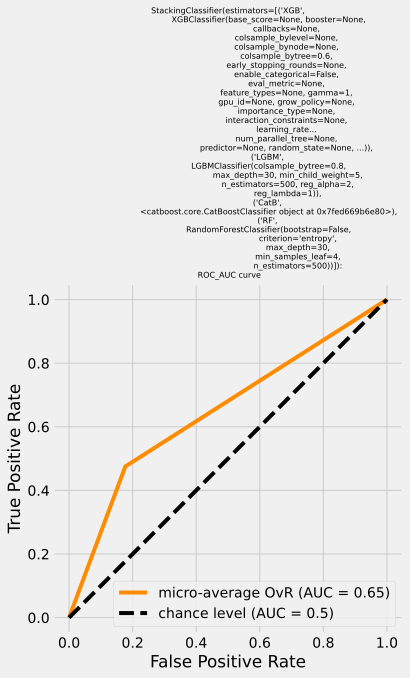

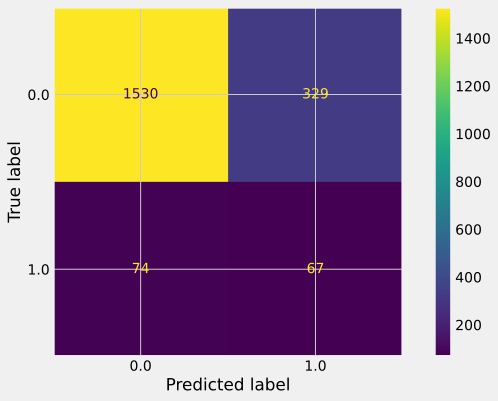

ROC_AUC best score: 0.61
Fcb score: 0.33
Accuracy score: 0.85
Recall score: 0.33
Precision score: 0.18
Entropy score: 0.47


In [ ]:
# Modeling by stacking XGB, LGBM, CatB and RandomForest
# Define Stacking classifier algorithm
stackclf = StackingClassifier([('XGB', XGB_RDCV), ('LGBM', LGBM_RDCV), ('CatB', CatB_RDCV), ('RF', RF_RDCV) ])
# Fit stacking classifier
stackclf.fit(Xs_train, ys_train)
# Display ROC_AUC curve
roc_auc_plot(stackclf, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(stackclf, Xs_test, ys_test)
# Stacking model metrics
_,_,_,_,_,_= get_metrics(RF_RDCV, ys_test, Xs_test)

In [ ]:
exp_name = "Stack_classifier"
model = stackclf
tag= "Stack(XGB, LGBM, CatB, RF"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(stackclf, ys_test, Xs_test)
run_params = None

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

ROC_AUC best score: 0.65
Fcb score: 0.47
Accuracy score: 0.8
Recall score: 0.48
Precision score: 0.17
Entropy score: 0.44
Run - SMOTE10_RUS70 is logged to Experiment - Stack_classifier


### Production pipeline

0:	learn: 0.4662325	total: 32.6ms	remaining: 16.3s
1:	learn: 0.3576044	total: 61ms	remaining: 15.2s
2:	learn: 0.3061690	total: 93.3ms	remaining: 15.5s
3:	learn: 0.2808737	total: 123ms	remaining: 15.2s
4:	learn: 0.2668763	total: 157ms	remaining: 15.6s
5:	learn: 0.2571289	total: 189ms	remaining: 15.6s
6:	learn: 0.2484311	total: 223ms	remaining: 15.7s
7:	learn: 0.2419657	total: 256ms	remaining: 15.8s
8:	learn: 0.2383499	total: 290ms	remaining: 15.8s
9:	learn: 0.2352623	total: 318ms	remaining: 15.6s
10:	learn: 0.2317875	total: 353ms	remaining: 15.7s
11:	learn: 0.2298565	total: 381ms	remaining: 15.5s
12:	learn: 0.2268627	total: 416ms	remaining: 15.6s
13:	learn: 0.2255567	total: 445ms	remaining: 15.5s
14:	learn: 0.2238856	total: 482ms	remaining: 15.6s
15:	learn: 0.2225446	total: 511ms	remaining: 15.5s
16:	learn: 0.2203155	total: 544ms	remaining: 15.4s
17:	learn: 0.2196896	total: 573ms	remaining: 15.3s
18:	learn: 0.2176871	total: 623ms	remaining: 15.8s
19:	learn: 0.2148666	total: 655ms	remain

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



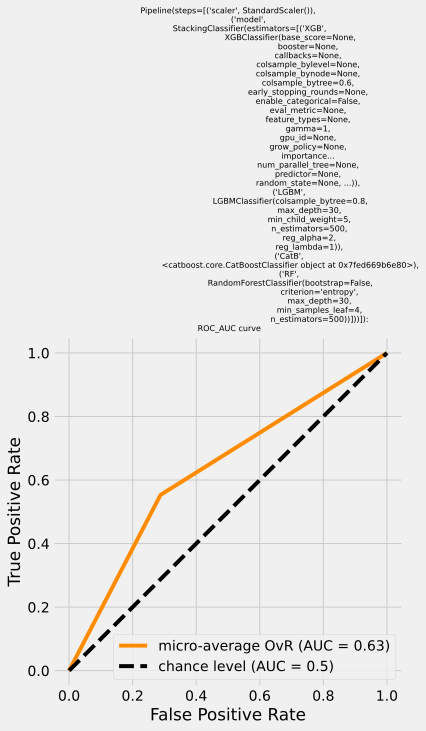

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



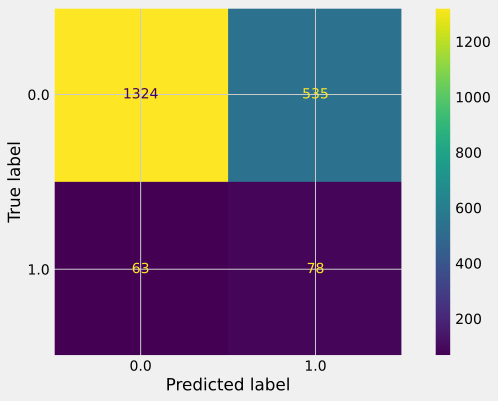

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



ROC_AUC best score: 0.63
Fcb score: 0.54
Accuracy score: 0.7
Recall score: 0.55
Precision score: 0.13
Entropy score: 0.6


In [ ]:
from sklearn.pipeline import Pipeline

model = stackclf
steps= [('scaler', preprocessing.StandardScaler()), ('model', model)]
Propipline = Pipeline(steps=steps)
# Fit pipeline to training data
Propipline.fit(X_train, y_train)
# Display ROC_AUC curve
roc_auc_plot(Propipline, Xs_test, ys_test)
# Display confusion matrix
confusion_matrix(Propipline, Xs_test, ys_test)
# model metrics
_,_,_,_,_,_= get_metrics(Propipline, ys_test, Xs_test)

In [ ]:
exp_name = "Production pipeline"
model = stackclf
tag= "Pro_pipeline"
run_name="SMOTE10_RUS70"
run_metrics = get_metrics(Propipline, ys_test, Xs_test)
run_params = None

experiment(exp_name, run_name, run_metrics, model, tag, 'confusion_matrix.png', 'roc_auc_curve.png' , run_params=run_params)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



ROC_AUC best score: 0.63
Fcb score: 0.54
Accuracy score: 0.7
Recall score: 0.55
Precision score: 0.13
Entropy score: 0.6
Run - SMOTE10_RUS70 is logged to Experiment - Production pipeline


### Models analysis

In [ ]:
def shap_generator(model, X_train):
  import shap
  #load js visualisation to Notebook
  explainer = shap.TreeExplainer(model)
  shap_values = explainer.shap_values(X_train)
  return explainer, shap_values

In [ ]:
Xs_train_df = pd.DataFrame(Xs_train, columns=X_train.columns)
Xs_train_df.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


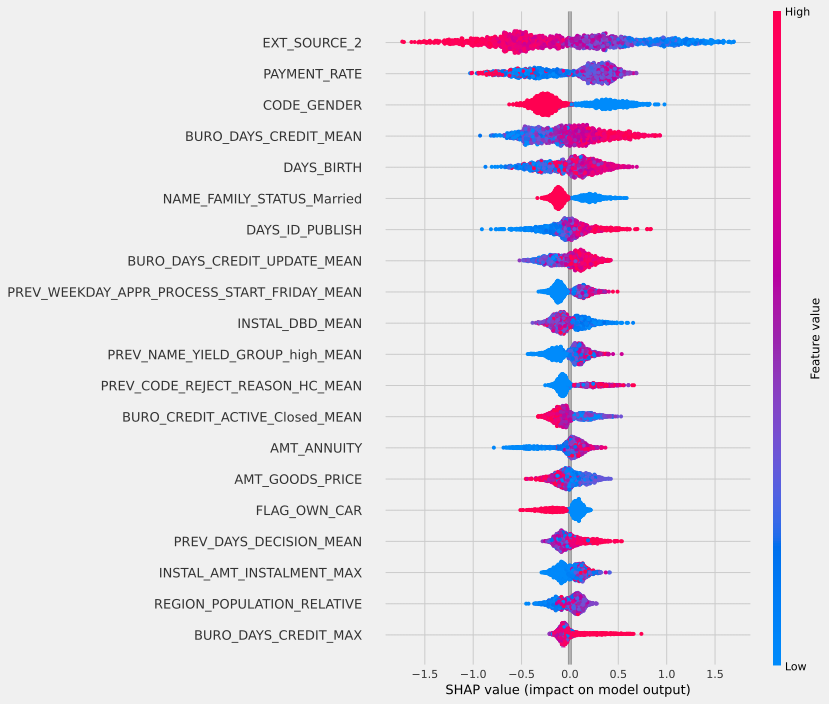

In [ ]:
import shap
explainer, shap_values = shap_generator(XGB_RDCV, Xs_train_df)
shap.summary_plot(shap_values, Xs_train_df, plot_size=(12, 10))

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


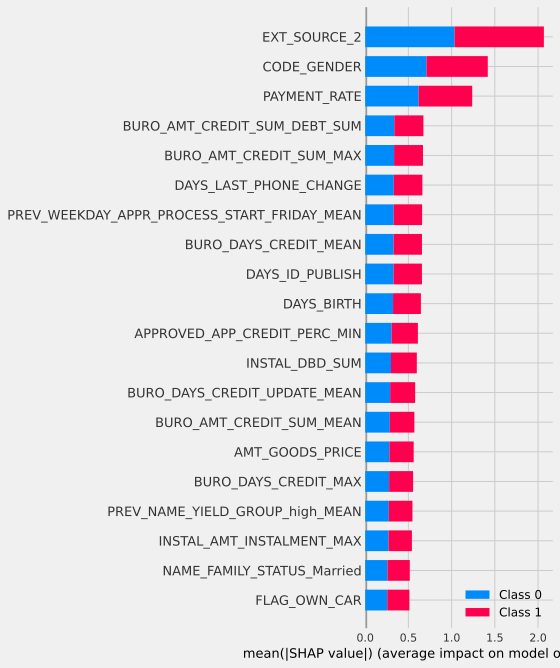

In [ ]:
explainer, shap_values = shap_generator(LGBM_RDCV, Xs_train_df)
shap.summary_plot(shap_values, Xs_train_df)

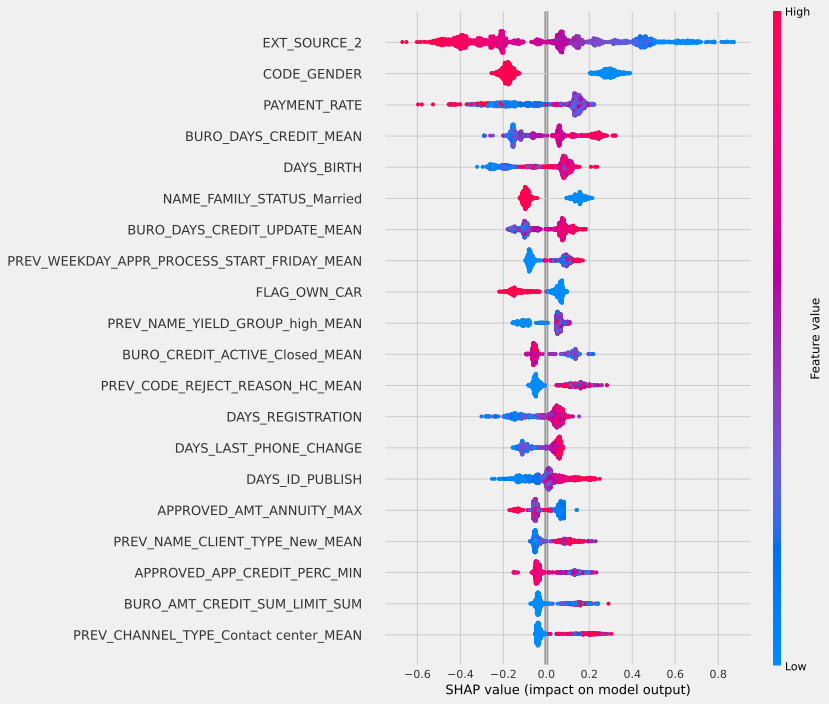

In [ ]:
explainer, shap_values = shap_generator(CatB_RDCV, Xs_train_df)
shap.summary_plot(shap_values, Xs_train_df, plot_size=(12, 10))

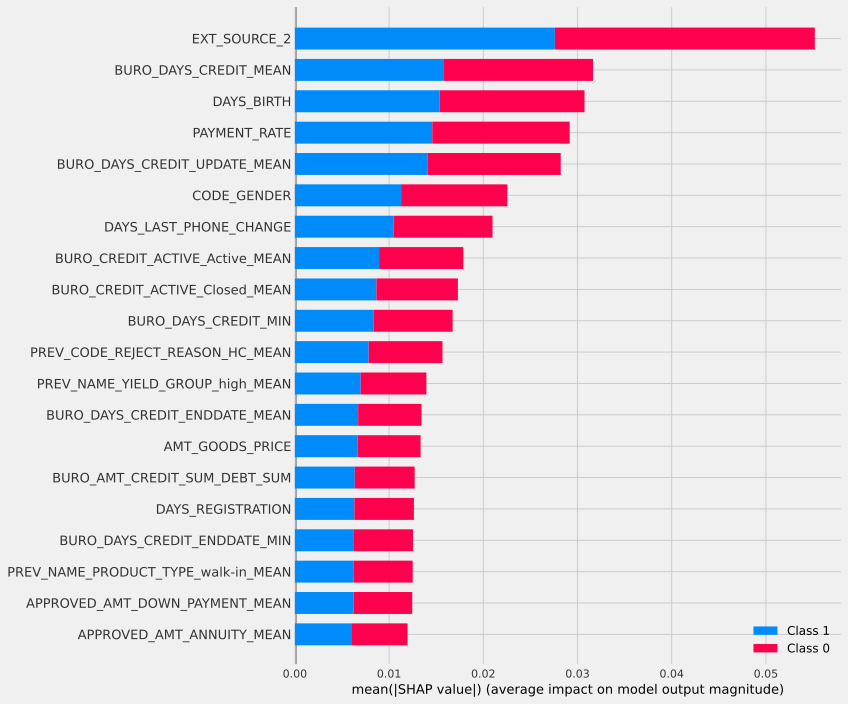

In [ ]:
explainer, shap_values = shap_generator(RF_RDCV, Xs_train_df)
shap.summary_plot(shap_values, Xs_train_df, plot_size=(12, 10))

# Save the model

## Serealize model

In [ ]:
import joblib

In [ ]:
joblib.dump(Propipline , 'pipeline_CBScoring.joblib') can be done with Pickle library

NameError: ignored

# MLFlow model registry

In [ ]:
#Reigiter a model
logged_model = 'runs:/9e30b6c870b6458c95391fab2363ecf8/model'
registered_model_name = "Stacking_classifier"
model_source ="/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/artifacts/6/9e30b6c870b6458c95391fab2363ecf8/artifacts/model"
run_id = "9e30b6c870b6458c95391fab2363ecf8"
#Method 1
model_registry1(logged_model, registered_model_name)
#Method 2
#model_registry2(registered_model_name, model_source = model_source, run_id= run_id )

Successfully registered model 'Stacking_classifier'.
2023/03/23 04:25:59 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation.                     Model name: Stacking_classifier, version 1
Created version '1' of model 'Stacking_classifier'.


In [ ]:
#Reigiter a model
logged_model = 'runs:/d06e6db7b75c4937917f08d0c88da289/model'
registered_model_name = "XGB_classifier"
model_source = "/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/artifacts/1/d06e6db7b75c4937917f08d0c88da289/artifacts/model"
run_id = "d06e6db7b75c4937917f08d0c88da289"
#Method 1
model_registry1(logged_model, registered_model_name)
#Method 2
#model_registry2(registered_model_name, model_source = model_source, run_id= run_id )

Registered model 'XGB_classifier' already exists. Creating a new version of this model...
2023/03/22 20:18:32 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation.                     Model name: XGB_classifier, version 2
Created version '2' of model 'XGB_classifier'.


In [ ]:
#Reigiter a model
logged_model = 'runs:/b30f2fe7282b4efa8979e86c28c8378a/model'
registered_model_name = "Dummy_classifier"
model_source = "/content/artifacts/1/b30f2fe7282b4efa8979e86c28c8378a/artifacts/model"
run_id = "b30f2fe7282b4efa8979e86c28c8378a"
#Method 1
model_registry1(logged_model, registered_model_name)
#Method 2
#model_registry2(registered_model_name, model_source = model_source, run_id= run_id  )

Successfully registered model 'Dummy_classifier'.
2023/03/20 15:24:42 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation.                     Model name: Dummy_classifier, version 1
Created version '1' of model 'Dummy_classifier'.


## Model staging

In [ ]:
client = mlflow.tracking.MlflowClient()
client.transition_model_version_stage(
    name = registered_model_name,
    version = 1,
    stage ="Production"
)

<ModelVersion: creation_timestamp=1679336497403, current_stage='Production', description='', last_updated_timestamp=1679336509871, name='XGB_classifier', run_id='784b1c7df2784c019bfe4225b289b061', run_link='', source='/content/artifacts/2/784b1c7df2784c019bfe4225b289b061/artifacts/model', status='READY', status_message='', tags={}, user_id='', version='1'>

In [ ]:
import mlflow.pyfunc

model_name = model_name
stage = 'Production'

model = mlflow.pyfunc.load_model(
    model_uri=f"models:/{model_name}/{stage}"
)

y_pred = model.predict(X_test)
print(y_pred)

## Mlflow model loading

In [ ]:
import mlflow.pyfunc

model_name = "Stacking_classifier"
model_version = 1
client_pred = client_data(100007, X_train.columns)

model = mlflow.pyfunc.load_model(
    model_uri=f"models:/{model_name}/{model_version}"
)

y_pred = model.predict(client_pred)
print(y_pred)

sklearn_model = mlflow.sklearn.load_model(
    model_uri=f"models:/{model_name}/{model_version}"
)
# Convert loaded model to pickle file
with open('pad_pkl_model.pkl', 'wb') as f:
    pickle.dump(sklearn_model, f)
with open('pad_pkl_model.pkl', 'rb') as f:
    pad_model = pickle.load(f)
y_pred_prob = sklearn_model.predict_proba(client_pred)
print(y_pred_prob)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



[0.]
[[0.53835578 0.46164422]]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



In [ ]:
import mlflow
import pickle
import mlflow.pyfunc
model_run = 'runs:/ee07a16309be4221b379bf98e88121a9/model'

# Load MLFLow model with run_id path (pyfunc: function tyoe object of python)
loaded_model = mlflow.pyfunc.load_model(model_run)

# Convert loaded model to pickle file
with open('cb_pkl_model.pkl', 'wb') as f:
    pickle.dump(loaded_model, f)
# Load the pickle file to ensure it was saved correctly
with open('cb_pkl_model.pkl', 'rb') as f:
    MF_model = pickle.load(f)

In [ ]:
app_data.head()

,Unnamed: 0,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Service

In [ ]:
with open('pad_pkl_model.pkl', 'rb') as f:
    pad_model = pickle.load(f)
pad_model.predict_proba(app_data.loc[app_data["SK_ID_CURR"]==100640, X_train.columns])[0,0]

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


0.5852524281726534

## Model serving

In [ ]:
#mlflow.set_tracking_uri('http://localhost:5000')
!set MLFLOW_TRACKING_URI= 'http://localhost:5000'
!mlflow models serve --model-uri models:/XGB_classifier/Production -p 1234

Traceback (most recent call last):
  File "/usr/local/bin/mlflow", line 8, in <module>
    sys.exit(cli())
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 1130, in __call__
    return self.main(*args, **kwargs)
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 1055, in main
    rv = self.invoke(ctx)
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 1657, in invoke
    return _process_result(sub_ctx.command.invoke(sub_ctx))
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 1657, in invoke
    return _process_result(sub_ctx.command.invoke(sub_ctx))
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 1404, in invoke
    return ctx.invoke(self.callback, **ctx.params)
  File "/usr/local/lib/python3.9/dist-packages/click/core.py", line 760, in invoke
    return __callback(*args, **kwargs)
  File "/usr/local/lib/python3.9/dist-packages/mlflow/models/cli.py", line 105, in serve
    return get_flavor_backe

In [ ]:
import requests
inference_request = {
        "dataframe_records": client_pred.values.tolist()
}
endpoint = "http://localhost:1234/invocations"
response = requests.post(endpoint, json=inference_request)
print(response.text)

TypeError: ignored

# Flask

In [ ]:
!curl -s https://ngrok-agent.s3.amazonaws.com/ngrok.asc | sudo tee /etc/apt/trusted.gpg.d/ngrok.asc >/dev/null && echo "deb https://ngrok-agent.s3.amazonaws.com buster main" | sudo tee /etc/apt/sources.list.d/ngrok.list && sudo apt update && sudo apt install ngrok

deb https://ngrok-agent.s3.amazonaws.com buster main
Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Hit:3 http://archive.ubuntu.com/ubuntu focal InRelease
Get:4 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease [18.1 kB]
Get:6 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:7 https://ngrok-agent.s3.amazonaws.com buster InRelease [20.3 kB]
Get:8 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ Packages [73.4 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [923 kB]
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:13 

In [ ]:
!ngrok config add-authtoken 2NCNhQH4tIpApomK9f9PrqShS1t_oMF5TYNPj1ZbZHBmZGiT

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [ ]:
ngrok_tunnel("8080")

Tracking UI: https://97eb-34-67-60-27.ngrok.io


In [ ]:
%%writefile appFlask.py
from flask import Flask, render_template, request, jsonify
import sklearn
#from flask_ngrok import run_with_ngrok

path= "./app_data.csv"

app_data = pd.read_csv(path)
app_data=app_data.set_index("SK_ID_CURR")

with open('pad_pkl_model.pkl', 'rb') as f:
    pad_model = pickle.load(f)

features = ['EXT_SOURCE_2', 'PAYMENT_RATE', 'CODE_GENDER', 'BURO_DAYS_CREDIT_MEAN', 'DAYS_BIRTH',
    'DAYS_ID_PUBLISH', 'BURO_DAYS_CREDIT_UPDATE_MEAN']

@app.route('/')
def home():
  return render_template('indexFLASK.html')

@app.route('/predict',methods=['POST'])
def predict():
  client_id = int(request.form['client_id'])
  client_data = app_data.loc[app_data["SK_ID_CURR"]==client_id, features]
  prediction = model.predict_proba(client_data)
  return render_template('indexFLASK.html', output="Client statute: {}".format(prediction[0, 1]))

if __name__=='__main__':
   app.run()

Overwriting appFlask.py


In [ ]:
app_data.loc[:,features].mean()

EXT_SOURCE_2                        0.516046
PAYMENT_RATE                        0.053350
CODE_GENDER                         0.666200
BURO_DAYS_CREDIT_MEAN           -1085.319693
DAYS_BIRTH                     -15988.421900
DAYS_ID_PUBLISH                 -3034.452200
BURO_DAYS_CREDIT_UPDATE_MEAN     -550.719943
dtype: float64

# Streamlit

In [ ]:
%%writefile appStreamlit.py

import streamlit as st
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
from streamlit_echarts import st_echarts
import pyecharts.options as opts
from pyecharts.charts import Line
import pickle
from streamlit_echarts import st_echarts
import plotly.graph_objects as go
import plotly.express as px

path= "./app_data.csv"

app_data = pd.read_csv(path)
app_data=app_data.set_index("SK_ID_CURR")

with open('pad_pkl_model.pkl', 'rb') as f:
    pad_model = pickle.load(f)


features = ['EXT_SOURCE_2', 'PAYMENT_RATE', 'CODE_GENDER', "FLAG_OWN_CAR"]#,
      #"INSTAL_DBD_MEAN"]

# Define a function that accepts input data and returns a prediction
def predict(client_id):
    score = app_data.loc[int(client_id),"SCORE"]
    # Return the prediction as a response
    return round(100-score,2)

# Define the Streamlit app
def main():
    # Set the app title
    st.header(':red[PAD] bank loan scoring')
    # Add a text input for the user to enter input data
    client_id = st.text_input('client id')

  #score_button
    if st.button("SCORE"):
      SCORE = predict(client_id)
      st.write(f"Your score is: {SCORE}")
      st.dataframe(app_data.loc[int(client_id),features])

  #score gauge
      option = {
          "series": [
              {
                  "type": "gauge",
                  "startAngle": 180,
                  "endAngle": 0,
                  "min": 0,
                  "max": 100,
                  "center": ["50%", "80%"],
                  'radius':'120%',
                  "splitNumber": 5,
                  "axisLine": {
                      "lineStyle": {
                          "width": 6,
                          "color": [
                              [0.25, "#FF403F"],
                              [0.5, "#ffa500"],
                              [0.75, "#FDDD60"],
                              [1, "#64C88A"],
                          ],
                      }
                  },
                  "pointer": {
                      "icon": "path://M12.8,0.7l12,40.1H0.7L12.8,0.7z",
                      "length": "12%",
                      "width": 30,
                      "offsetCenter": [0, "-60%"],
                      "itemStyle": {"color": "auto"},
                  },
                  "axisTick": {"length": 10, "lineStyle": {"color": "auto", "width": 2}},
                  "splitLine": {"length": 15, "lineStyle": {"color": "auto", "width": 5}},
                  "axisLabel": {
                      "color": "#464646",
                      "fontSize": 12,
                      "distance": -60,
                  },
                  "title": {"offsetCenter": [0, "-20%"], "fontSize": 20},
                  "detail": {
                      "fontSize": 30,
                      "offsetCenter": [0, "0%"],
                      "valueAnimation": True,
                      "color": "auto",
                      "formatter": SCORE,
                  },
                  "data": [{"value": SCORE, "name": "Client score"}],
              }
          ]
      }

      st_echarts(option, width="450px", height="350px", key="gauge")

    #Important features scores
    if st.button("FEATURES"):
      tab1, tab2 = st.tabs(["📈 Features golbal", "Features detail"])
      with tab1:
        fig1 = go.Figure()
        # Create and style traces
        fig1.add_trace(go.Scatter(x=features, y=app_data.loc[:, features].mean().tolist(), name='MEAN',
                                line=dict(color='firebrick', width=4)))
        fig1.add_trace(go.Scatter(x=features, y=app_data.loc[:, features].max().tolist(),name='MAX',
                                line=dict(color='royalblue', width=4)))
        fig1.add_trace(go.Scatter(x=features, y=app_data.loc[:, features].min().tolist(),name='MIN',
                                line=dict(color='green', width=4))) # dash options include 'dash', 'dot', and 'dashdot'))

        # Edit the layout
        fig1.update_layout(title='Features score',
                          xaxis_title="Features",
                          yaxis_title='Values')
        #tab1.subheader("Features: Mean, Max, Min")
        st.plotly_chart(fig1)

      with tab2:
        fig2 = px.box(app_data.loc[:, features], x=features, color="CODE_GENDER", points="all")
        #tab2.subheader("Features: Details"))
        st.plotly_chart(fig2)


if __name__ == '__main__':
    main()

Overwriting appStreamlit.py


In [ ]:
#Running streamlit app
!streamlit run appStreamlit.py &>/dev/null&

In [ ]:
ngrok_tunnel("8501")

INFO:pyngrok.process:Killing ngrok process: 231413
2023-03-24 15:23:38.676 Killing ngrok process: 231413
INFO:pyngrok.process:Updating authtoken for default "config_path" of "ngrok_path": /usr/local/lib/python3.9/dist-packages/pyngrok/bin/ngrok
2023-03-24 15:23:38.687 Updating authtoken for default "config_path" of "ngrok_path": /usr/local/lib/python3.9/dist-packages/pyngrok/bin/ngrok
INFO:pyngrok.ngrok:Opening tunnel named: http-8501-5ad8587d-1859-4ebf-9266-8eaa88374bcc
2023-03-24 15:23:38.733 Opening tunnel named: http-8501-5ad8587d-1859-4ebf-9266-8eaa88374bcc
INFO:pyngrok.process.ngrok:t=2023-03-24T15:23:38+0000 lvl=info msg="no configuration paths supplied"
2023-03-24 15:23:38.785 t=2023-03-24T15:23:38+0000 lvl=info msg="no configuration paths supplied"
INFO:pyngrok.process.ngrok:t=2023-03-24T15:23:38+0000 lvl=info msg="using configuration at default config path" path=/root/.ngrok2/ngrok.yml
2023-03-24 15:23:38.798 t=2023-03-24T15:23:38+0000 lvl=info msg="using configuration at def

Tracking UI: https://96b0-34-86-41-133.ngrok.io


2023-03-24 15:23:38.961 t=2023-03-24T15:23:38+0000 lvl=info msg="started tunnel" obj=tunnels name=http-8501-5ad8587d-1859-4ebf-9266-8eaa88374bcc addr=http://localhost:8501 url=https://96b0-34-86-41-133.ngrok.io
INFO:pyngrok.process.ngrok:t=2023-03-24T15:23:38+0000 lvl=info msg=end pg=/api/tunnels id=9b1e7b4d900bf043 status=201 dur=26.247978ms
2023-03-24 15:23:38.969 t=2023-03-24T15:23:38+0000 lvl=info msg=end pg=/api/tunnels id=9b1e7b4d900bf043 status=201 dur=26.247978ms


In [ ]:
path= "app_data.csv"
txt = pd.read_csv(path, engine= 'python', sep=',', chunksize=100, usecols=lambda col: col not in ['Unnamed: 0', 'index'])
app_data = pd.concat(txt, ignore_index=True)

In [ ]:
score = app_data[app_data["SK_ID_CURR"]==100645]["PAYMENT_RATE"]
score
#app_data["SCORE"] = app_data["SCORE"].apply(lambda x : round(float(x.iloc[0]),2))

403    0.03543
Name: PAYMENT_RATE, dtype: float64

# Drift monitoring

In [ ]:
pip install evidently

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 39.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd

from evidently.dashboard import Dashboard
from evidently.pipeline.column_mapping import ColumnMapping
from evidently.dashboard.tabs import DataDriftTab

from evidently.model_profile import Profile
from evidently.model_profile.sections import DataDriftProfileSection

/usr/local/lib/python3.9/dist-packages/evidently/analyzers/__init__.py:3: UserWarning: analyzers are deprecated, use metrics instead
  warnings.warn("analyzers are deprecated, use metrics instead")
/usr/local/lib/python3.9/dist-packages/evidently/dashboard/__init__.py:8: UserWarning: dashboards are deprecated, use metrics instead
  warnings.warn("dashboards are deprecated, use metrics instead")
/usr/local/lib/python3.9/dist-packages/evidently/model_profile/__init__.py:8: UserWarning: model profiles are deprecated, use metrics instead
  warnings.warn("model profiles are deprecated, use metrics instead")


In [ ]:
drift_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/drift_data.csv")

In [ ]:
ref_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/ref_data.csv")

In [ ]:
ref_df.head()

,Unnamed: 0,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYP

In [ ]:
drift_features= ['EXT_SOURCE_2', 'PAYMENT_RATE', 'CODE_GENDER', 'BURO_DAYS_CREDIT_MEAN', 'DAYS_BIRTH',
'DAYS_ID_PUBLISH', 'BURO_DAYS_CREDIT_UPDATE_MEAN']

numerical_features = drift_features

column_mapping = ColumnMapping()

column_mapping.datetime = "date"
column_mapping.numerical_features = numerical_features

In [ ]:
#verbose_level == 1 - Full report
data_drift_dashboard = Dashboard(tabs=[DataDriftTab(verbose_level=1)])
data_drift_dashboard.calculate(X_train, drift_df, column_mapping=column_mapping)
data_drift_dashboard.show(mode="inline")

In [ ]:
data_drift_dashboard.save("drift_dashboard.html")

# Github

In [ ]:
!git init

Reinitialized existing Git repository in /content/drive/MyDrive/Colab Notebooks/P7-ScoringApp/Project_NB/.git/


In [ ]:
!git remote add origine https://github.com/Yassaadi/BankStreamlitApp.git

In [ ]:
!git config --global user.email 'yassine.assaadi@gmail.com'
!git config --global user.name 'Yassaadi'

error: unknown option `config'
usage: git config [<options>]

Config file location
    --global              use global config file
    --system              use system config file
    --local               use repository config file
    --worktree            use per-worktree config file
    -f, --file <file>     use given config file
    --blob <blob-id>      read config from given blob object

Action
    --get                 get value: name [value-regex]
    --get-all             get all values: key [value-regex]
    --get-regexp          get values for regexp: name-regex [value-regex]
    --get-urlmatch        get value specific for the URL: section[.var] URL
    --replace-all         replace all matching variables: name value [value_regex]
    --add                 add a new variable: name value
    --unset               remove a variable: name [value-regex]
    --unset-all           remove all matches: name [value-regex]
    --rename-section      rename section: old-name new-name

In [ ]:
!git add .
!git commit -m 'Firsrt commit'

On branch master

Initial commit

nothing to commit (create/copy files and use "git add" to track)


In [ ]:
!git push origine master

error: src refspec master does not match any
error: failed to push some refs to 'https://github.com/Yassaadi/P7_scoringAPP.git'


# Github Actions

In [ ]:
!pip freeze #> requirements.txt

absl-py==1.4.0
alabaster==0.7.13
albumentations==1.2.1
alembic==1.10.2
altair==4.2.2
appdirs==1.4.4
argon2-cffi==21.3.0
argon2-cffi-bindings==21.2.0
arviz==0.15.1
astropy==5.2.1
astunparse==1.6.3
atomicwrites==1.4.1
attrs==22.2.0
audioread==3.0.0
autograd==1.5
Babel==2.12.1
backcall==0.2.0
beautifulsoup4==4.11.2
bleach==6.0.0
blinker==1.5
blis==0.7.9
bokeh==2.4.3
branca==0.6.0
bs4==0.0.1
CacheControl==0.12.11
cachetools==5.3.0
catalogue==2.0.8
catboost==1.1.1
certifi==2022.12.7
cffi==1.15.1
chardet==3.0.4
charset-normalizer==2.0.12
click==8.1.3
cloudpickle==2.2.1
cmake==3.25.2
cmdstanpy==1.1.0
colorcet==3.0.1
colorlover==0.3.0
community==1.0.0b1
confection==0.0.4
cons==0.4.5
contextlib2==0.6.0.post1
contourpy==1.0.7
convertdate==2.4.0
cufflinks==0.17.3
cvxopt==1.3.0
cvxpy==1.3.1
cycler==0.11.0
cymem==2.0.7
Cython==0.29.33
dask==2022.12.1
databricks-cli==0.17.6
datascience==0.17.6
db-dtypes==1.0.5
dbus-python==1.2.16
debugpy==1.6.6
decorator==4.4.2
defusedxml==0.7.1
distributed==2022.12

# Tests unitaires